# CRCD Detectron2 Segmentation Training Example

This example is based on the official colab tutorial of Detectron2. <br>
Here, we will show how to load the datasets, fine tune and validate the models. <br>
For further details, please check the [Detectron2 official Github Repo](https://github.com/facebookresearch/detectron2).

# Import detectron2

In [1]:
import torch, detectron2
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.version.cuda
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

torch:  2.2 ; cuda:  12.1
detectron2: 0.6


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Loading the Dataset

In [3]:
# Registering the datasets
from detectron2.data.datasets import register_coco_instances

# the folder names containing the images
# you can add more annotations if necessary
fl_ids = ["E_3", "F_3"]

# path to the directory containing the dataset
dataset_path = '/path_to_dataset/'

for fl_id in fl_ids:
    filepath = dataset_path + fl_id
    register_coco_instances(fl_id+"_train", {}, filepath + '/train.json', filepath) # registers the training data
    register_coco_instances(fl_id+"_test", {}, filepath + '/test.json', filepath) # registers the validation data
    MetadataCatalog.get(fl_id+"_train").thing_colors = [(255,0,0), (0,0,255)]

In [4]:
# the dataset used for testing the model after training
test_id = "C_1"
filepath = dataset_path + test_id
register_coco_instances(test_id + "_test", {}, filepath + '/annotations.json', filepath)
MetadataCatalog.get(test_id+"_test").thing_colors = [(255,0,0),(0,0,255)]

# Visualization

To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



[10/15 15:05:45 d2.data.datasets.coco]: Loading /home/leo/dt2_dataset/liver/dataset/E_3/train.json takes 10.17 seconds.
WARNING [10/15 15:05:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/15 15:05:45 d2.data.datasets.coco]: Loaded 19872 images in COCO format from /home/leo/dt2_dataset/liver/dataset/E_3/train.json


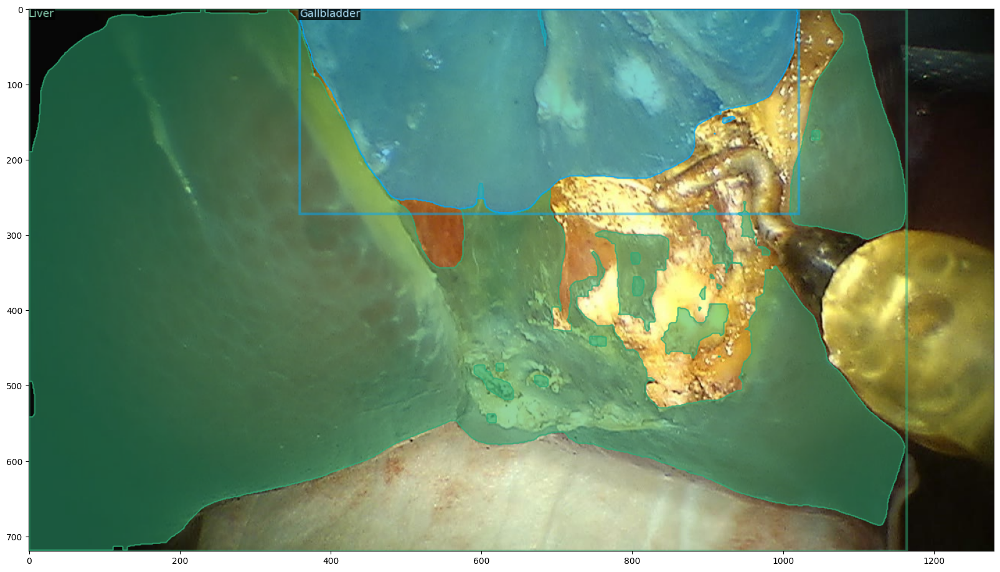

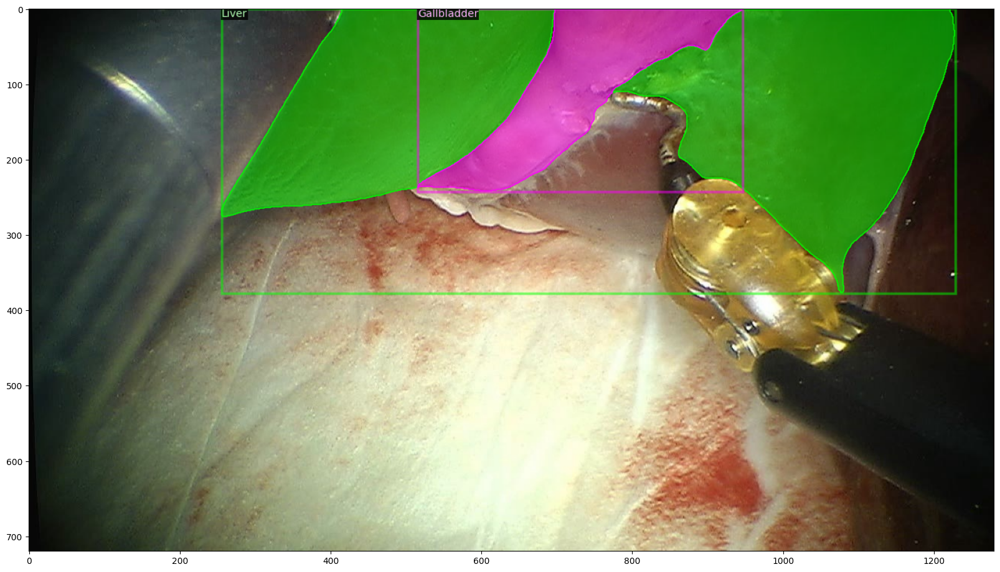

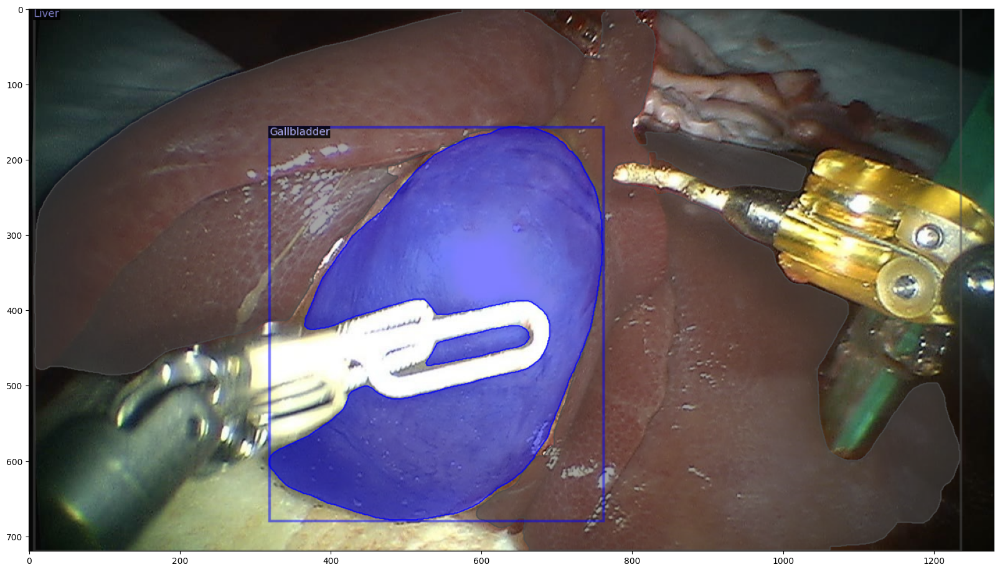

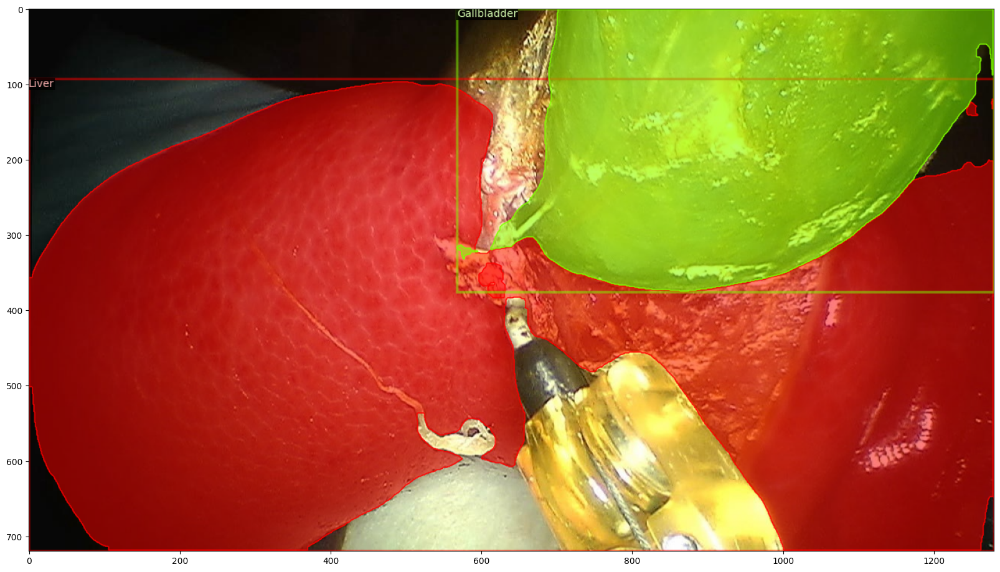

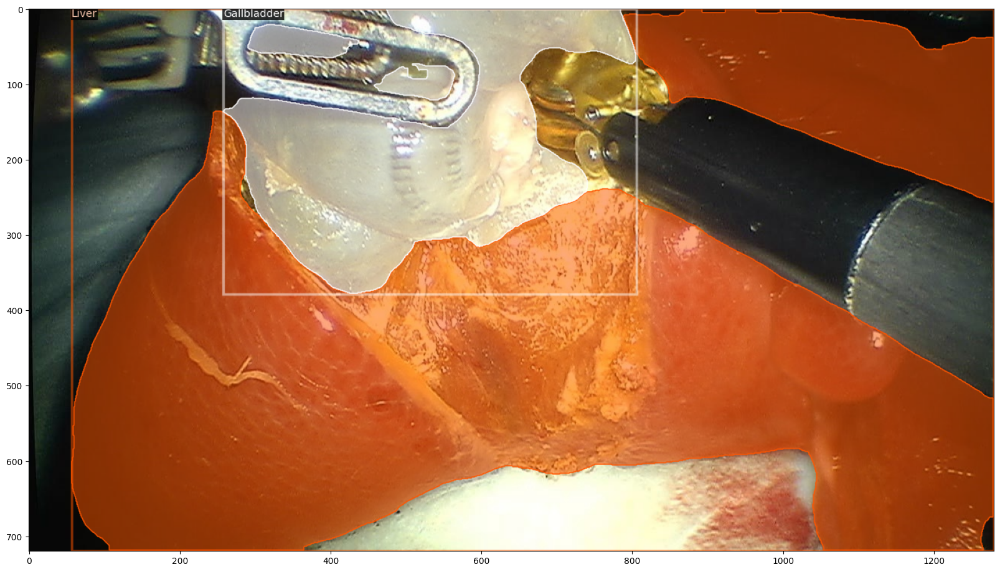

In [5]:
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import ColorMode

cur_data_id = fl_ids[0]+"_train"

dataset_dicts = DatasetCatalog.get(cur_data_id)

for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d['file_name'])
    visualizer = Visualizer(
        img,
        metadata=MetadataCatalog.get(cur_data_id),
        scale=1.0
    )
    out = visualizer.draw_dataset_dict(d)
    plt.figure(figsize = (20,20))
    plt.imshow(out.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the current dataset.


In [7]:
from detectron2.engine import DefaultTrainer

# The configuration used for the model described in the paper.
# Feel free to tune it!
# More details and options are illustrated in 
# https://detectron2.readthedocs.io/en/latest/modules/config.html#yaml-config-references

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = tuple([fl_id+"_train" for fl_id in fl_ids])
cfg.DATALOADER.NUM_WORKERS = 1
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.01
cfg.SOLVER.MAX_ITER = 10000
cfg.SOLVER.STEPS = [*range(2000, cfg.SOLVER.MAX_ITER, int(cfg.SOLVER.MAX_ITER/10))]
cfg.SOLVER.GAMMA = 0.5
cfg.SOLVER.WARMUP_FACTOR = 1.0
cfg.SOLVER.WARMUP_ITERS = 500
cfg.SOLVER.WARMUP_METHOD = "linear"
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6
cfg.OUTPUT_DIR = dataset_path + '/output' # the path where the model will be saved. Make sure to modify accordingly!

In [8]:
# Start fine tuning the model!
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/15 15:06:32 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (7, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (7,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (24, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (24,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (6, 256, 1, 1) 

[10/15 15:07:10 d2.engine.train_loop]: Starting training from iteration 0


/home/leo/anaconda3/envs/maskdino/lib/python3.10/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1711403380909/work/aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[10/15 15:07:19 d2.utils.events]:  eta: 1:00:07  iter: 19  total_loss: 0.9169  loss_cls: 0.1627  loss_box_reg: 0.1819  loss_mask: 0.4523  loss_rpn_cls: 0.009201  loss_rpn_loc: 0.1362    time: 0.3589  last_time: 0.3242  data_time: 0.0728  last_data_time: 0.0567   lr: 0.01  max_mem: 4445M
[10/15 15:07:26 d2.utils.events]:  eta: 0:59:09  iter: 39  total_loss: 0.7209  loss_cls: 0.09244  loss_box_reg: 0.1439  loss_mask: 0.3633  loss_rpn_cls: 0.00914  loss_rpn_loc: 0.08832    time: 0.3571  last_time: 0.3478  data_time: 0.0578  last_data_time: 0.0592   lr: 0.01  max_mem: 4445M
[10/15 15:07:33 d2.utils.events]:  eta: 0:59:22  iter: 59  total_loss: 0.5704  loss_cls: 0.06955  loss_box_reg: 0.1404  loss_mask: 0.2615  loss_rpn_cls: 0.008483  loss_rpn_loc: 0.09789    time: 0.3577  last_time: 0.3308  data_time: 0.0583  last_data_time: 0.0566   lr: 0.01  max_mem: 4445M
[10/15 15:07:40 d2.utils.events]:  eta: 0:59:21  iter: 79  total_loss: 0.5449  loss_cls: 0.07601  loss_box_reg: 0.1178  loss_mask: 0.

KeyboardInterrupt: 

[10/25 17:42:43 d2.utils.events]:  eta: 0:45:18  iter: 16659  total_loss: 0.1786  loss_cls: 0.01914  loss_box_reg: 0.03843  loss_mask: 0.08113  loss_rpn_cls: 0.0009533  loss_rpn_loc: 0.03401  time: 0.2004  data_time: 0.0058  lr: 1e-08  max_mem: 2441M
[10/25 17:42:47 d2.utils.events]:  eta: 0:45:14  iter: 16679  total_loss: 0.1845  loss_cls: 0.02143  loss_box_reg: 0.0416  loss_mask: 0.08487  loss_rpn_cls: 0.0007921  loss_rpn_loc: 0.03598  time: 0.2004  data_time: 0.0057  lr: 1e-08  max_mem: 2441M
[10/25 17:42:51 d2.utils.events]:  eta: 0:45:10  iter: 16699  total_loss: 0.1936  loss_cls: 0.02347  loss_box_reg: 0.04752  loss_mask: 0.08313  loss_rpn_cls: 0.0005047  loss_rpn_loc: 0.04106  time: 0.2004  data_time: 0.0057  lr: 1e-08  max_mem: 2441M
[10/25 17:42:55 d2.utils.events]:  eta: 0:45:04  iter: 16719  total_loss: 0.1857  loss_cls: 0.01995  loss_box_reg: 0.03677  loss_mask: 0.07511  loss_rpn_cls: 0.0006981  loss_rpn_loc: 0.04061  time: 0.2004  data_time: 0.0060  lr: 1e-08  max_mem: 244

[10/25 17:44:52 d2.utils.events]:  eta: 0:43:05  iter: 17299  total_loss: 0.1853  loss_cls: 0.0193  loss_box_reg: 0.03772  loss_mask: 0.07728  loss_rpn_cls: 0.0008318  loss_rpn_loc: 0.0475  time: 0.2005  data_time: 0.0061  lr: 1e-08  max_mem: 2441M
[10/25 17:44:57 d2.utils.events]:  eta: 0:43:02  iter: 17319  total_loss: 0.1777  loss_cls: 0.01639  loss_box_reg: 0.03151  loss_mask: 0.07556  loss_rpn_cls: 0.0008694  loss_rpn_loc: 0.04472  time: 0.2005  data_time: 0.0064  lr: 1e-08  max_mem: 2441M
[10/25 17:45:01 d2.utils.events]:  eta: 0:42:59  iter: 17339  total_loss: 0.1937  loss_cls: 0.02224  loss_box_reg: 0.03317  loss_mask: 0.0874  loss_rpn_cls: 0.0006417  loss_rpn_loc: 0.03804  time: 0.2005  data_time: 0.0057  lr: 1e-08  max_mem: 2441M
[10/25 17:45:05 d2.utils.events]:  eta: 0:42:55  iter: 17359  total_loss: 0.1774  loss_cls: 0.01624  loss_box_reg: 0.03471  loss_mask: 0.08143  loss_rpn_cls: 0.0006301  loss_rpn_loc: 0.05097  time: 0.2005  data_time: 0.0063  lr: 1e-08  max_mem: 2441M

[10/25 17:47:02 d2.utils.events]:  eta: 0:40:48  iter: 17939  total_loss: 0.2041  loss_cls: 0.02024  loss_box_reg: 0.04379  loss_mask: 0.09216  loss_rpn_cls: 0.001384  loss_rpn_loc: 0.04035  time: 0.2005  data_time: 0.0062  lr: 1e-08  max_mem: 2441M
[10/25 17:47:06 d2.utils.events]:  eta: 0:40:45  iter: 17959  total_loss: 0.1928  loss_cls: 0.02168  loss_box_reg: 0.04284  loss_mask: 0.08848  loss_rpn_cls: 0.0005497  loss_rpn_loc: 0.04207  time: 0.2005  data_time: 0.0061  lr: 1e-08  max_mem: 2441M
[10/25 17:47:09 d2.utils.events]:  eta: 0:40:40  iter: 17979  total_loss: 0.1766  loss_cls: 0.01779  loss_box_reg: 0.03109  loss_mask: 0.07856  loss_rpn_cls: 0.0005709  loss_rpn_loc: 0.04234  time: 0.2005  data_time: 0.0059  lr: 1e-08  max_mem: 2441M
[10/25 17:47:14 d2.utils.events]:  eta: 0:40:36  iter: 17999  total_loss: 0.1814  loss_cls: 0.01636  loss_box_reg: 0.03436  loss_mask: 0.08229  loss_rpn_cls: 0.0006948  loss_rpn_loc: 0.04541  time: 0.2005  data_time: 0.0059  lr: 1e-08  max_mem: 244

[10/25 17:49:11 d2.utils.events]:  eta: 0:38:43  iter: 18579  total_loss: 0.2246  loss_cls: 0.01933  loss_box_reg: 0.03536  loss_mask: 0.0918  loss_rpn_cls: 0.0009119  loss_rpn_loc: 0.05026  time: 0.2005  data_time: 0.0062  lr: 1e-09  max_mem: 2441M
[10/25 17:49:15 d2.utils.events]:  eta: 0:38:40  iter: 18599  total_loss: 0.1775  loss_cls: 0.0193  loss_box_reg: 0.03147  loss_mask: 0.07765  loss_rpn_cls: 0.001121  loss_rpn_loc: 0.04702  time: 0.2005  data_time: 0.0064  lr: 1e-09  max_mem: 2441M
[10/25 17:49:19 d2.utils.events]:  eta: 0:38:35  iter: 18619  total_loss: 0.1784  loss_cls: 0.02171  loss_box_reg: 0.03833  loss_mask: 0.07808  loss_rpn_cls: 0.0007349  loss_rpn_loc: 0.03798  time: 0.2005  data_time: 0.0059  lr: 1e-09  max_mem: 2441M
[10/25 17:49:23 d2.utils.events]:  eta: 0:38:32  iter: 18639  total_loss: 0.1822  loss_cls: 0.01613  loss_box_reg: 0.03241  loss_mask: 0.08532  loss_rpn_cls: 0.0008851  loss_rpn_loc: 0.05329  time: 0.2005  data_time: 0.0064  lr: 1e-09  max_mem: 2441M

[10/25 17:51:21 d2.utils.events]:  eta: 0:36:32  iter: 19219  total_loss: 0.1767  loss_cls: 0.0188  loss_box_reg: 0.03693  loss_mask: 0.07454  loss_rpn_cls: 0.0007097  loss_rpn_loc: 0.04199  time: 0.2006  data_time: 0.0064  lr: 1e-09  max_mem: 2441M
[10/25 17:51:25 d2.utils.events]:  eta: 0:36:30  iter: 19239  total_loss: 0.1833  loss_cls: 0.02215  loss_box_reg: 0.03962  loss_mask: 0.07752  loss_rpn_cls: 0.0005562  loss_rpn_loc: 0.03551  time: 0.2006  data_time: 0.0063  lr: 1e-09  max_mem: 2441M
[10/25 17:51:29 d2.utils.events]:  eta: 0:36:26  iter: 19259  total_loss: 0.1618  loss_cls: 0.01809  loss_box_reg: 0.03237  loss_mask: 0.06404  loss_rpn_cls: 0.0008176  loss_rpn_loc: 0.0412  time: 0.2006  data_time: 0.0064  lr: 1e-09  max_mem: 2441M
[10/25 17:51:33 d2.utils.events]:  eta: 0:36:22  iter: 19279  total_loss: 0.1754  loss_cls: 0.01617  loss_box_reg: 0.03095  loss_mask: 0.07198  loss_rpn_cls: 0.000665  loss_rpn_loc: 0.04376  time: 0.2006  data_time: 0.0064  lr: 1e-09  max_mem: 2441M

[10/25 17:53:31 d2.utils.events]:  eta: 0:34:29  iter: 19859  total_loss: 0.1845  loss_cls: 0.01687  loss_box_reg: 0.03516  loss_mask: 0.08513  loss_rpn_cls: 0.0005872  loss_rpn_loc: 0.0495  time: 0.2007  data_time: 0.0063  lr: 1e-09  max_mem: 2441M
[10/25 17:53:35 d2.utils.events]:  eta: 0:34:26  iter: 19879  total_loss: 0.1871  loss_cls: 0.01976  loss_box_reg: 0.03848  loss_mask: 0.07931  loss_rpn_cls: 0.0006933  loss_rpn_loc: 0.05073  time: 0.2007  data_time: 0.0062  lr: 1e-09  max_mem: 2441M
[10/25 17:53:39 d2.utils.events]:  eta: 0:34:22  iter: 19899  total_loss: 0.1906  loss_cls: 0.0193  loss_box_reg: 0.04124  loss_mask: 0.07942  loss_rpn_cls: 0.0007456  loss_rpn_loc: 0.04302  time: 0.2007  data_time: 0.0059  lr: 1e-09  max_mem: 2441M
[10/25 17:53:43 d2.utils.events]:  eta: 0:34:17  iter: 19919  total_loss: 0.1924  loss_cls: 0.02309  loss_box_reg: 0.03579  loss_mask: 0.08287  loss_rpn_cls: 0.0007375  loss_rpn_loc: 0.04443  time: 0.2007  data_time: 0.0064  lr: 1e-09  max_mem: 2441

[10/25 17:55:40 d2.utils.events]:  eta: 0:32:11  iter: 20499  total_loss: 0.1794  loss_cls: 0.01766  loss_box_reg: 0.03115  loss_mask: 0.07685  loss_rpn_cls: 0.0007822  loss_rpn_loc: 0.04198  time: 0.2007  data_time: 0.0064  lr: 1e-09  max_mem: 2441M
[10/25 17:55:44 d2.utils.events]:  eta: 0:32:07  iter: 20519  total_loss: 0.1698  loss_cls: 0.01784  loss_box_reg: 0.03049  loss_mask: 0.07604  loss_rpn_cls: 0.001509  loss_rpn_loc: 0.04259  time: 0.2007  data_time: 0.0063  lr: 1e-09  max_mem: 2441M
[10/25 17:55:48 d2.utils.events]:  eta: 0:32:03  iter: 20539  total_loss: 0.184  loss_cls: 0.01795  loss_box_reg: 0.03337  loss_mask: 0.0798  loss_rpn_cls: 0.0004637  loss_rpn_loc: 0.03947  time: 0.2007  data_time: 0.0063  lr: 1e-09  max_mem: 2441M
[10/25 17:55:52 d2.utils.events]:  eta: 0:31:58  iter: 20559  total_loss: 0.1859  loss_cls: 0.02139  loss_box_reg: 0.04235  loss_mask: 0.08008  loss_rpn_cls: 0.000755  loss_rpn_loc: 0.03867  time: 0.2007  data_time: 0.0060  lr: 1e-09  max_mem: 2441M


[10/25 17:57:49 d2.utils.events]:  eta: 0:30:02  iter: 21139  total_loss: 0.1927  loss_cls: 0.02229  loss_box_reg: 0.04008  loss_mask: 0.07788  loss_rpn_cls: 0.00057  loss_rpn_loc: 0.04497  time: 0.2007  data_time: 0.0062  lr: 1e-10  max_mem: 2441M
[10/25 17:57:53 d2.utils.events]:  eta: 0:29:58  iter: 21159  total_loss: 0.1724  loss_cls: 0.01932  loss_box_reg: 0.03518  loss_mask: 0.08751  loss_rpn_cls: 0.0006534  loss_rpn_loc: 0.03321  time: 0.2007  data_time: 0.0064  lr: 1e-10  max_mem: 2441M
[10/25 17:57:57 d2.utils.events]:  eta: 0:29:54  iter: 21179  total_loss: 0.1776  loss_cls: 0.01778  loss_box_reg: 0.03911  loss_mask: 0.07713  loss_rpn_cls: 0.0007589  loss_rpn_loc: 0.04673  time: 0.2007  data_time: 0.0062  lr: 1e-10  max_mem: 2441M
[10/25 17:58:01 d2.utils.events]:  eta: 0:29:51  iter: 21199  total_loss: 0.1914  loss_cls: 0.01923  loss_box_reg: 0.03474  loss_mask: 0.08351  loss_rpn_cls: 0.0008702  loss_rpn_loc: 0.04714  time: 0.2007  data_time: 0.0062  lr: 1e-10  max_mem: 2441

[10/25 17:59:58 d2.utils.events]:  eta: 0:27:52  iter: 21779  total_loss: 0.1704  loss_cls: 0.01601  loss_box_reg: 0.0316  loss_mask: 0.07665  loss_rpn_cls: 0.0005252  loss_rpn_loc: 0.03946  time: 0.2007  data_time: 0.0063  lr: 1e-10  max_mem: 2441M
[10/25 18:00:02 d2.utils.events]:  eta: 0:27:48  iter: 21799  total_loss: 0.1811  loss_cls: 0.01631  loss_box_reg: 0.0332  loss_mask: 0.07542  loss_rpn_cls: 0.0008167  loss_rpn_loc: 0.04028  time: 0.2008  data_time: 0.0063  lr: 1e-10  max_mem: 2441M
[10/25 18:00:07 d2.utils.events]:  eta: 0:27:44  iter: 21819  total_loss: 0.1812  loss_cls: 0.01793  loss_box_reg: 0.03252  loss_mask: 0.08945  loss_rpn_cls: 0.0008908  loss_rpn_loc: 0.04324  time: 0.2008  data_time: 0.0063  lr: 1e-10  max_mem: 2441M
[10/25 18:00:11 d2.utils.events]:  eta: 0:27:41  iter: 21839  total_loss: 0.1769  loss_cls: 0.01829  loss_box_reg: 0.02964  loss_mask: 0.08463  loss_rpn_cls: 0.0005147  loss_rpn_loc: 0.04575  time: 0.2008  data_time: 0.0063  lr: 1e-10  max_mem: 2441

[10/25 18:02:08 d2.utils.events]:  eta: 0:25:42  iter: 22419  total_loss: 0.1949  loss_cls: 0.01912  loss_box_reg: 0.03797  loss_mask: 0.0909  loss_rpn_cls: 0.0006634  loss_rpn_loc: 0.04166  time: 0.2008  data_time: 0.0064  lr: 1e-10  max_mem: 2441M
[10/25 18:02:12 d2.utils.events]:  eta: 0:25:37  iter: 22439  total_loss: 0.1837  loss_cls: 0.01735  loss_box_reg: 0.03079  loss_mask: 0.07933  loss_rpn_cls: 0.0009714  loss_rpn_loc: 0.05062  time: 0.2008  data_time: 0.0062  lr: 1e-10  max_mem: 2441M
[10/25 18:02:16 d2.utils.events]:  eta: 0:25:33  iter: 22459  total_loss: 0.168  loss_cls: 0.01804  loss_box_reg: 0.03284  loss_mask: 0.06881  loss_rpn_cls: 0.00148  loss_rpn_loc: 0.04041  time: 0.2008  data_time: 0.0063  lr: 1e-10  max_mem: 2441M
[10/25 18:02:20 d2.utils.events]:  eta: 0:25:29  iter: 22479  total_loss: 0.2152  loss_cls: 0.02736  loss_box_reg: 0.04277  loss_mask: 0.08717  loss_rpn_cls: 0.0006048  loss_rpn_loc: 0.04259  time: 0.2008  data_time: 0.0064  lr: 1e-10  max_mem: 2441M


[10/25 18:04:18 d2.utils.events]:  eta: 0:23:33  iter: 23059  total_loss: 0.1657  loss_cls: 0.01643  loss_box_reg: 0.03032  loss_mask: 0.07242  loss_rpn_cls: 0.0005234  loss_rpn_loc: 0.04056  time: 0.2008  data_time: 0.0058  lr: 1e-10  max_mem: 2441M
[10/25 18:04:22 d2.utils.events]:  eta: 0:23:29  iter: 23079  total_loss: 0.1842  loss_cls: 0.02316  loss_box_reg: 0.04113  loss_mask: 0.07715  loss_rpn_cls: 0.001523  loss_rpn_loc: 0.03725  time: 0.2008  data_time: 0.0060  lr: 1e-10  max_mem: 2441M
[10/25 18:04:26 d2.utils.events]:  eta: 0:23:24  iter: 23099  total_loss: 0.172  loss_cls: 0.01647  loss_box_reg: 0.03241  loss_mask: 0.06689  loss_rpn_cls: 0.0008715  loss_rpn_loc: 0.0463  time: 0.2008  data_time: 0.0062  lr: 1e-10  max_mem: 2441M
[10/25 18:04:30 d2.utils.events]:  eta: 0:23:20  iter: 23119  total_loss: 0.2046  loss_cls: 0.01707  loss_box_reg: 0.03593  loss_mask: 0.08211  loss_rpn_cls: 0.0005971  loss_rpn_loc: 0.05017  time: 0.2008  data_time: 0.0065  lr: 1e-10  max_mem: 2441M

[10/25 18:06:27 d2.utils.events]:  eta: 0:21:22  iter: 23699  total_loss: 0.1827  loss_cls: 0.01672  loss_box_reg: 0.0345  loss_mask: 0.09727  loss_rpn_cls: 0.0005378  loss_rpn_loc: 0.0394  time: 0.2009  data_time: 0.0062  lr: 1e-10  max_mem: 2441M
[10/25 18:06:32 d2.utils.events]:  eta: 0:21:18  iter: 23719  total_loss: 0.1828  loss_cls: 0.01906  loss_box_reg: 0.03417  loss_mask: 0.06899  loss_rpn_cls: 0.001074  loss_rpn_loc: 0.04964  time: 0.2009  data_time: 0.0065  lr: 1e-10  max_mem: 2441M
[10/25 18:06:36 d2.utils.events]:  eta: 0:21:14  iter: 23739  total_loss: 0.1828  loss_cls: 0.01769  loss_box_reg: 0.03354  loss_mask: 0.0789  loss_rpn_cls: 0.0007978  loss_rpn_loc: 0.04584  time: 0.2009  data_time: 0.0067  lr: 1e-10  max_mem: 2441M
[10/25 18:06:40 d2.utils.events]:  eta: 0:21:10  iter: 23759  total_loss: 0.1741  loss_cls: 0.02014  loss_box_reg: 0.03345  loss_mask: 0.0798  loss_rpn_cls: 0.0004127  loss_rpn_loc: 0.04546  time: 0.2009  data_time: 0.0061  lr: 1e-10  max_mem: 2441M
[

[10/25 18:08:37 d2.utils.events]:  eta: 0:19:10  iter: 24339  total_loss: 0.1915  loss_cls: 0.01951  loss_box_reg: 0.03662  loss_mask: 0.09295  loss_rpn_cls: 0.0006006  loss_rpn_loc: 0.04548  time: 0.2009  data_time: 0.0060  lr: 1e-11  max_mem: 2441M
[10/25 18:08:41 d2.utils.events]:  eta: 0:19:05  iter: 24359  total_loss: 0.1863  loss_cls: 0.02049  loss_box_reg: 0.03742  loss_mask: 0.07404  loss_rpn_cls: 0.000683  loss_rpn_loc: 0.04201  time: 0.2009  data_time: 0.0058  lr: 1e-11  max_mem: 2441M
[10/25 18:08:45 d2.utils.events]:  eta: 0:19:02  iter: 24379  total_loss: 0.1757  loss_cls: 0.01786  loss_box_reg: 0.03529  loss_mask: 0.0767  loss_rpn_cls: 0.0005971  loss_rpn_loc: 0.03438  time: 0.2009  data_time: 0.0060  lr: 1e-11  max_mem: 2441M
[10/25 18:08:49 d2.utils.events]:  eta: 0:18:58  iter: 24399  total_loss: 0.1705  loss_cls: 0.01553  loss_box_reg: 0.0315  loss_mask: 0.07258  loss_rpn_cls: 0.0004306  loss_rpn_loc: 0.03771  time: 0.2009  data_time: 0.0061  lr: 1e-11  max_mem: 2441M

[10/25 18:10:47 d2.utils.events]:  eta: 0:17:00  iter: 24979  total_loss: 0.1944  loss_cls: 0.0196  loss_box_reg: 0.04011  loss_mask: 0.08704  loss_rpn_cls: 0.0004954  loss_rpn_loc: 0.04266  time: 0.2009  data_time: 0.0063  lr: 1e-11  max_mem: 2441M
[10/25 18:10:51 d2.utils.events]:  eta: 0:16:56  iter: 24999  total_loss: 0.2047  loss_cls: 0.01828  loss_box_reg: 0.0331  loss_mask: 0.09184  loss_rpn_cls: 0.0009256  loss_rpn_loc: 0.04147  time: 0.2009  data_time: 0.0060  lr: 1e-11  max_mem: 2441M
[10/25 18:10:55 d2.utils.events]:  eta: 0:16:51  iter: 25019  total_loss: 0.1704  loss_cls: 0.01588  loss_box_reg: 0.03398  loss_mask: 0.07046  loss_rpn_cls: 0.0004597  loss_rpn_loc: 0.03679  time: 0.2009  data_time: 0.0058  lr: 1e-11  max_mem: 2441M
[10/25 18:10:59 d2.utils.events]:  eta: 0:16:48  iter: 25039  total_loss: 0.1828  loss_cls: 0.01384  loss_box_reg: 0.02859  loss_mask: 0.07235  loss_rpn_cls: 0.001134  loss_rpn_loc: 0.04742  time: 0.2009  data_time: 0.0066  lr: 1e-11  max_mem: 2441M

[10/25 18:12:57 d2.utils.events]:  eta: 0:14:52  iter: 25619  total_loss: 0.1917  loss_cls: 0.01636  loss_box_reg: 0.03776  loss_mask: 0.07582  loss_rpn_cls: 0.0008734  loss_rpn_loc: 0.04442  time: 0.2010  data_time: 0.0063  lr: 1e-11  max_mem: 2441M
[10/25 18:13:01 d2.utils.events]:  eta: 0:14:49  iter: 25639  total_loss: 0.2017  loss_cls: 0.01995  loss_box_reg: 0.03498  loss_mask: 0.07657  loss_rpn_cls: 0.0007936  loss_rpn_loc: 0.04575  time: 0.2010  data_time: 0.0062  lr: 1e-11  max_mem: 2441M
[10/25 18:13:05 d2.utils.events]:  eta: 0:14:45  iter: 25659  total_loss: 0.1896  loss_cls: 0.01621  loss_box_reg: 0.0302  loss_mask: 0.08228  loss_rpn_cls: 0.0006277  loss_rpn_loc: 0.04883  time: 0.2010  data_time: 0.0062  lr: 1e-11  max_mem: 2441M
[10/25 18:13:09 d2.utils.events]:  eta: 0:14:40  iter: 25679  total_loss: 0.1874  loss_cls: 0.01788  loss_box_reg: 0.03548  loss_mask: 0.08412  loss_rpn_cls: 0.0004673  loss_rpn_loc: 0.04494  time: 0.2010  data_time: 0.0062  lr: 1e-11  max_mem: 244

[10/25 18:15:07 d2.utils.events]:  eta: 0:12:43  iter: 26259  total_loss: 0.1803  loss_cls: 0.01818  loss_box_reg: 0.0362  loss_mask: 0.08493  loss_rpn_cls: 0.0007035  loss_rpn_loc: 0.04116  time: 0.2010  data_time: 0.0064  lr: 1e-11  max_mem: 2441M
[10/25 18:15:11 d2.utils.events]:  eta: 0:12:38  iter: 26279  total_loss: 0.196  loss_cls: 0.02001  loss_box_reg: 0.03827  loss_mask: 0.08745  loss_rpn_cls: 0.0007194  loss_rpn_loc: 0.03649  time: 0.2010  data_time: 0.0063  lr: 1e-11  max_mem: 2441M
[10/25 18:15:15 d2.utils.events]:  eta: 0:12:34  iter: 26299  total_loss: 0.1936  loss_cls: 0.01541  loss_box_reg: 0.03141  loss_mask: 0.08294  loss_rpn_cls: 0.0008295  loss_rpn_loc: 0.04543  time: 0.2010  data_time: 0.0063  lr: 1e-11  max_mem: 2441M
[10/25 18:15:19 d2.utils.events]:  eta: 0:12:30  iter: 26319  total_loss: 0.1826  loss_cls: 0.01659  loss_box_reg: 0.03195  loss_mask: 0.08098  loss_rpn_cls: 0.0005496  loss_rpn_loc: 0.03896  time: 0.2010  data_time: 0.0062  lr: 1e-11  max_mem: 2441

[10/25 18:17:16 d2.utils.events]:  eta: 0:10:31  iter: 26899  total_loss: 0.1737  loss_cls: 0.01759  loss_box_reg: 0.02939  loss_mask: 0.06734  loss_rpn_cls: 0.0009685  loss_rpn_loc: 0.04122  time: 0.2010  data_time: 0.0060  lr: 1e-11  max_mem: 2441M
[10/25 18:17:20 d2.utils.events]:  eta: 0:10:26  iter: 26919  total_loss: 0.178  loss_cls: 0.01645  loss_box_reg: 0.03233  loss_mask: 0.07685  loss_rpn_cls: 0.0008238  loss_rpn_loc: 0.0517  time: 0.2010  data_time: 0.0063  lr: 1e-11  max_mem: 2441M
[10/25 18:17:24 d2.utils.events]:  eta: 0:10:22  iter: 26939  total_loss: 0.1796  loss_cls: 0.01638  loss_box_reg: 0.03778  loss_mask: 0.08612  loss_rpn_cls: 0.0006739  loss_rpn_loc: 0.04636  time: 0.2010  data_time: 0.0061  lr: 1e-11  max_mem: 2441M
[10/25 18:17:28 d2.utils.events]:  eta: 0:10:18  iter: 26959  total_loss: 0.1963  loss_cls: 0.02263  loss_box_reg: 0.04451  loss_mask: 0.08688  loss_rpn_cls: 0.001305  loss_rpn_loc: 0.03747  time: 0.2010  data_time: 0.0065  lr: 1e-11  max_mem: 2441M

[10/25 18:19:23 d2.utils.events]:  eta: 0:08:15  iter: 27539  total_loss: 0.1763  loss_cls: 0.01943  loss_box_reg: 0.02989  loss_mask: 0.08315  loss_rpn_cls: 0.0007616  loss_rpn_loc: 0.04095  time: 0.2010  data_time: 0.0059  lr: 1e-12  max_mem: 2441M
[10/25 18:19:27 d2.utils.events]:  eta: 0:08:10  iter: 27559  total_loss: 0.1891  loss_cls: 0.02034  loss_box_reg: 0.03764  loss_mask: 0.08662  loss_rpn_cls: 0.001333  loss_rpn_loc: 0.03859  time: 0.2010  data_time: 0.0059  lr: 1e-12  max_mem: 2441M
[10/25 18:19:31 d2.utils.events]:  eta: 0:08:06  iter: 27579  total_loss: 0.188  loss_cls: 0.01711  loss_box_reg: 0.04139  loss_mask: 0.08305  loss_rpn_cls: 0.0007374  loss_rpn_loc: 0.04486  time: 0.2010  data_time: 0.0061  lr: 1e-12  max_mem: 2441M
[10/25 18:19:35 d2.utils.events]:  eta: 0:08:02  iter: 27599  total_loss: 0.2096  loss_cls: 0.02135  loss_box_reg: 0.03062  loss_mask: 0.08928  loss_rpn_cls: 0.0007742  loss_rpn_loc: 0.05353  time: 0.2010  data_time: 0.0063  lr: 1e-12  max_mem: 2441

[10/25 18:21:30 d2.utils.events]:  eta: 0:06:02  iter: 28179  total_loss: 0.1647  loss_cls: 0.01802  loss_box_reg: 0.03565  loss_mask: 0.07436  loss_rpn_cls: 0.000631  loss_rpn_loc: 0.03278  time: 0.2009  data_time: 0.0060  lr: 1e-12  max_mem: 2441M
[10/25 18:21:34 d2.utils.events]:  eta: 0:05:58  iter: 28199  total_loss: 0.1789  loss_cls: 0.02047  loss_box_reg: 0.04185  loss_mask: 0.07691  loss_rpn_cls: 0.0007315  loss_rpn_loc: 0.04085  time: 0.2009  data_time: 0.0056  lr: 1e-12  max_mem: 2441M
[10/25 18:21:38 d2.utils.events]:  eta: 0:05:54  iter: 28219  total_loss: 0.1838  loss_cls: 0.01805  loss_box_reg: 0.02638  loss_mask: 0.07052  loss_rpn_cls: 0.0006705  loss_rpn_loc: 0.05199  time: 0.2009  data_time: 0.0060  lr: 1e-12  max_mem: 2441M
[10/25 18:21:42 d2.utils.events]:  eta: 0:05:50  iter: 28239  total_loss: 0.194  loss_cls: 0.01987  loss_box_reg: 0.02792  loss_mask: 0.0866  loss_rpn_cls: 0.0008817  loss_rpn_loc: 0.05179  time: 0.2009  data_time: 0.0059  lr: 1e-12  max_mem: 2441M

[10/25 18:23:36 d2.utils.events]:  eta: 0:03:55  iter: 28819  total_loss: 0.1807  loss_cls: 0.01908  loss_box_reg: 0.03391  loss_mask: 0.07663  loss_rpn_cls: 0.0009641  loss_rpn_loc: 0.04752  time: 0.2008  data_time: 0.0062  lr: 1e-12  max_mem: 2441M
[10/25 18:23:40 d2.utils.events]:  eta: 0:03:50  iter: 28839  total_loss: 0.1883  loss_cls: 0.01963  loss_box_reg: 0.03319  loss_mask: 0.08551  loss_rpn_cls: 0.000666  loss_rpn_loc: 0.04377  time: 0.2008  data_time: 0.0059  lr: 1e-12  max_mem: 2441M
[10/25 18:23:44 d2.utils.events]:  eta: 0:03:46  iter: 28859  total_loss: 0.1917  loss_cls: 0.02431  loss_box_reg: 0.03791  loss_mask: 0.08885  loss_rpn_cls: 0.0006199  loss_rpn_loc: 0.04258  time: 0.2008  data_time: 0.0062  lr: 1e-12  max_mem: 2441M
[10/25 18:23:48 d2.utils.events]:  eta: 0:03:42  iter: 28879  total_loss: 0.1683  loss_cls: 0.01731  loss_box_reg: 0.03396  loss_mask: 0.06875  loss_rpn_cls: 0.0006571  loss_rpn_loc: 0.04147  time: 0.2008  data_time: 0.0064  lr: 1e-12  max_mem: 244

[10/25 18:25:43 d2.utils.events]:  eta: 0:01:47  iter: 29459  total_loss: 0.1757  loss_cls: 0.01961  loss_box_reg: 0.0409  loss_mask: 0.06824  loss_rpn_cls: 0.000793  loss_rpn_loc: 0.03751  time: 0.2008  data_time: 0.0067  lr: 1e-12  max_mem: 2441M
[10/25 18:25:47 d2.utils.events]:  eta: 0:01:43  iter: 29479  total_loss: 0.1952  loss_cls: 0.01954  loss_box_reg: 0.03864  loss_mask: 0.08332  loss_rpn_cls: 0.0005874  loss_rpn_loc: 0.0472  time: 0.2008  data_time: 0.0065  lr: 1e-12  max_mem: 2441M
[10/25 18:25:51 d2.utils.events]:  eta: 0:01:39  iter: 29499  total_loss: 0.2177  loss_cls: 0.02202  loss_box_reg: 0.03733  loss_mask: 0.09144  loss_rpn_cls: 0.0006783  loss_rpn_loc: 0.04256  time: 0.2008  data_time: 0.0065  lr: 1e-12  max_mem: 2441M
[10/25 18:25:55 d2.utils.events]:  eta: 0:01:35  iter: 29519  total_loss: 0.2062  loss_cls: 0.02107  loss_box_reg: 0.04754  loss_mask: 0.08095  loss_rpn_cls: 0.0005886  loss_rpn_loc: 0.05124  time: 0.2008  data_time: 0.0062  lr: 1e-12  max_mem: 2441M

[10/25 18:27:36 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[10/25 18:27:36 d2.data.common]: Serializing 7570 elements to byte tensors and concatenating them all ...
[10/25 18:27:38 d2.data.common]: Serialized dataset takes 220.96 MiB
WARNING [10/25 18:27:38 d2.engine.defaults]: No evaluator found. Use `DefaultTrainer.test(evaluators=)`, or implement its `build_evaluator` method.


## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the validation dataset. First, let's create a predictor using the model we just trained:



In [7]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
# cfg.DATASETS.TEST = tuple([fl_id+"_test" for fl_id in fl_ids])
cfg.DATASETS.TEST = test_id + "_test"
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set a custom testing threshold

predictor = DefaultPredictor(cfg)

[10/15 13:25:20 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /home/leo/dt2_dataset/liver/dataset//results_jmrr/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

[10/15 13:25:29 d2.data.datasets.coco]: Loading /home/leo/dt2_dataset/liver/dataset/E_3/test.json takes 2.17 seconds.
WARNING [10/15 13:25:29 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/15 13:25:29 d2.data.datasets.coco]: Loaded 4968 images in COCO format from /home/leo/dt2_dataset/liver/dataset/E_3/test.json


/home/leo/anaconda3/envs/maskdino/lib/python3.10/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1711403380909/work/aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


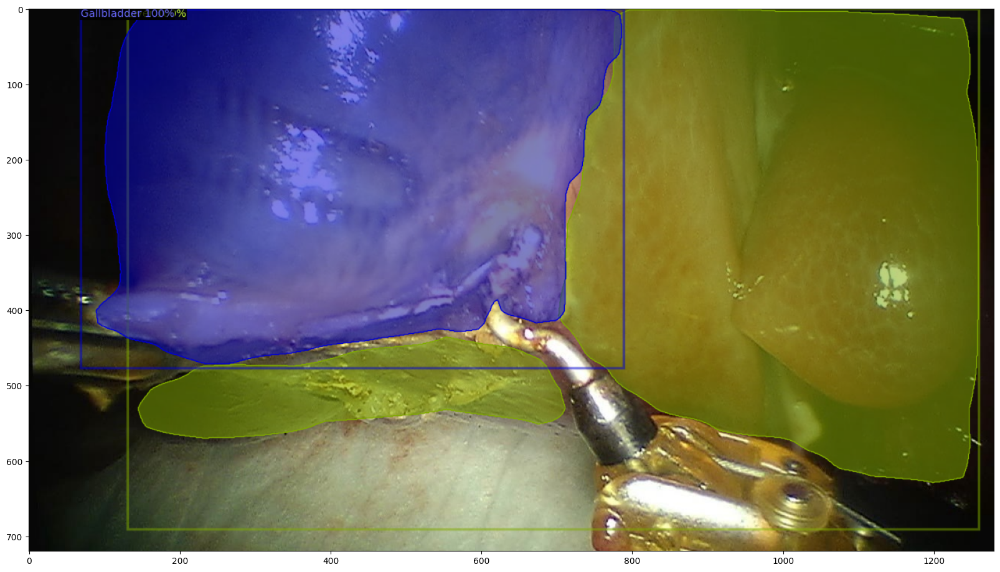

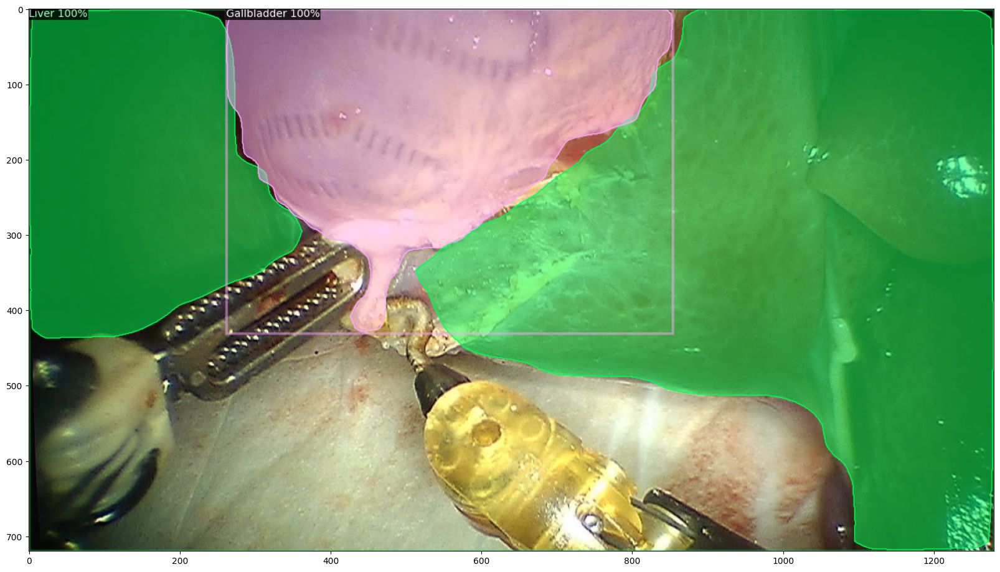

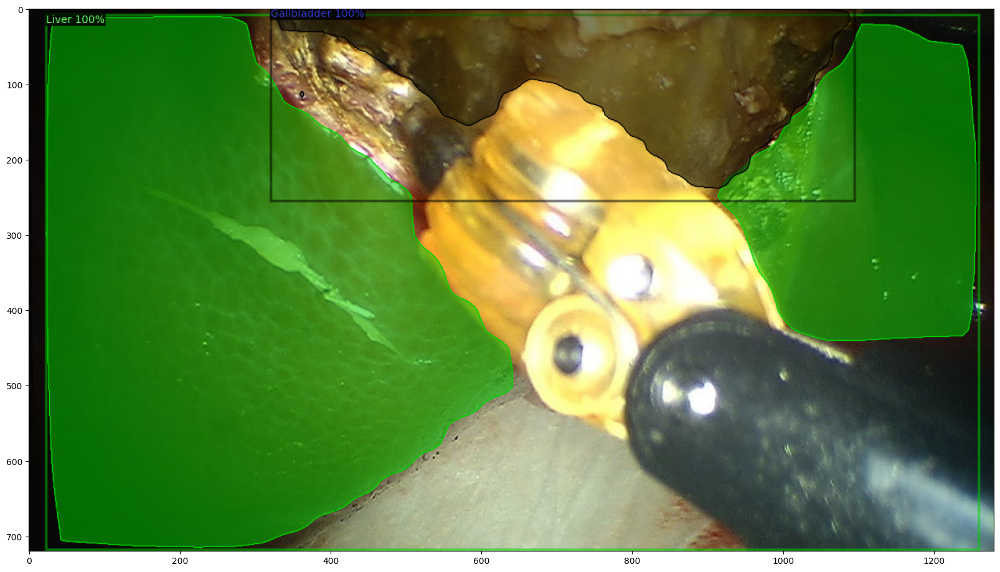

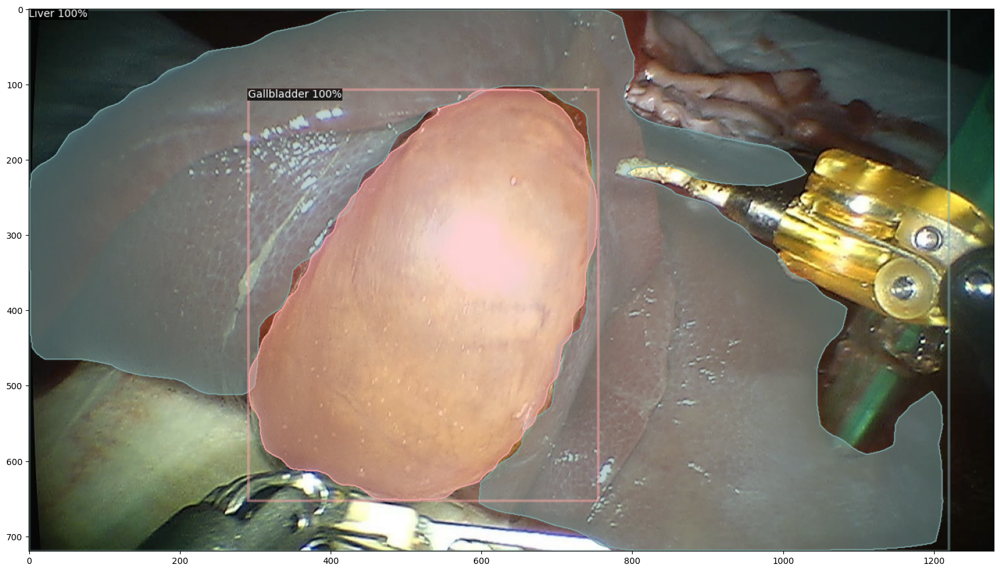

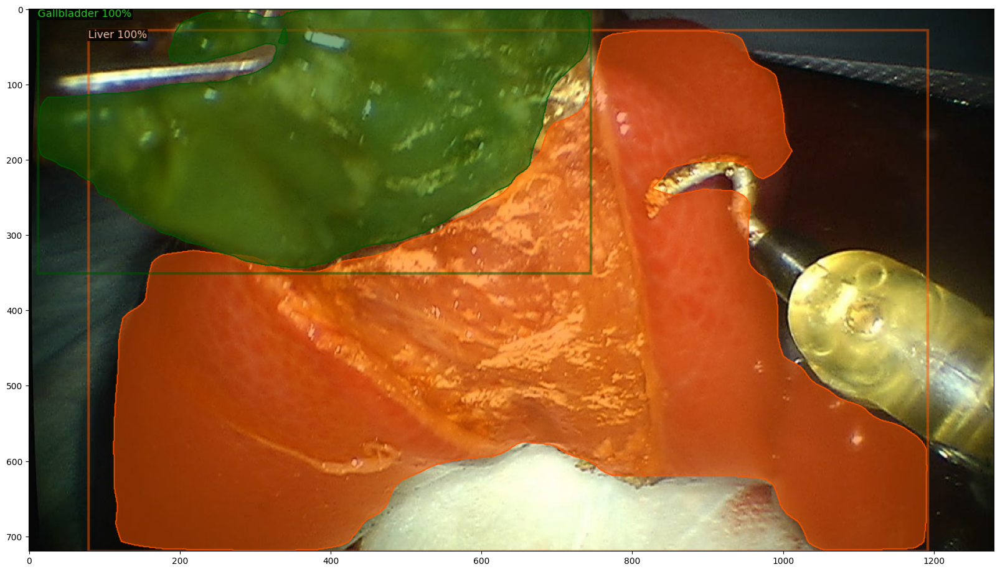

In [8]:
from detectron2.utils.visualizer import ColorMode
import matplotlib.pyplot as plt

cur_data_id = fl_ids[0]+"_test"

dataset_dicts = DatasetCatalog.get(cur_data_id)

for d in random.sample(dataset_dicts, 5):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(
        im,
        metadata=MetadataCatalog.get(cur_data_id),
        scale=1.0,
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (20,20))
    plt.imshow(out.get_image()[:, :, ::-1])

In [9]:
# Here it will evaluate the model with AP scores
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

test_dn = test_id + "_test"

evaluator = COCOEvaluator(test_dn, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, test_dn)
temp = inference_on_dataset(predictor.model, val_loader, evaluator)

[10/15 13:26:07 d2.data.datasets.coco]: Loading /home/leo/dt2_dataset/liver/dataset/C_1/annotations.json takes 2.87 seconds.
WARNING [10/15 13:26:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/15 13:26:07 d2.data.datasets.coco]: Loaded 5520 images in COCO format from /home/leo/dt2_dataset/liver/dataset/C_1/annotations.json
[10/15 13:26:07 d2.data.build]: Distribution of instances among all 6 categories:
|  category   | #instances   |  category  | #instances   |  category  | #instances   |
|:-----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    Meat     | 0            |    Skin    | 0            |   Liver    | 5520         |
| Gallbladder | 5520         |    FBF     | 0            |    PCH     | 0            |
|             |              |            |              |            |              |
|    total    | 11040        |            |              |            |             